# Machine Learning

# Tutorial 2: SVD, PCA, (linear) Generative Modeling

In this tutorial, we will cover:

- SVD
- PCA
- build a simple (linear) generative model with PCA

Prerequisites:

- Python
- Numpy tensor

Authors:

- Prof. Iacopo Masi


### Import dependencies

In this notebook we will extensively use **Matplotlib**, a powerful plotting library (there are many [visualization libraries](https://pyviz.org/overviews/index.html) for Python).
Effectively communicating your findings through plots and visualizations is an essential part of any scientific or engineering project.

[Here](https://matplotlib.org/) you can find **matplotlib** documentation.

Remember: Don't take our suggestions as a dogma. If you prefer other plotting libraries, use them! In fact, we will be using different ones in this notebook to give you a gist of what's out there.

In [49]:
import numpy as np
import cv2 # opencv
#%matplotlib inline
import matplotlib.pyplot as plt

### A note on reproducibility

In our ML experiments, we will frequently encounter _randomness_. For example, whenever we want to generate some quick-and-dirty data to test our algorithms on the fly, we will just create some random matrices and points. In addition, many ML algorithms actually _rely on randomness_ due to the several beneficial properties it brings along! **Random forests** and **stochastic gradient descent** are two prominent examples.

Here's an idea: for our tests, we want to ensure that we always generate "the same randomness", so that anyone who will use our code will be able to reproduce exactly our results.

We do this by providing a hand-picked, fixed **seed** to the random number generator (RNG). The specific value of the feed is not important: what matters is that it's constant.

In [50]:
# Reproducibility stuff
import random
np.random.seed(42)  # initialize NumPy's RNG
random.seed(0)      # initialize Python's built-in RNG

## Recap on SVD

Think SVD as a way to really "see" what is the "complexity" or the "size" of a matrix. There is the "size" of vectors which is related to the notation of **norm**.

Likewise there is the notion of **norm** for matrices that tell us the "size" of a matrix. The **norm** for matrix always depend on the **singular values** of it. So the **singular values** tells you how much the matrix is "big", "complex", its size.

L2 norm for matrices:
$|| \mathbf{A}||_2 = \sigma_\max $ (the max of the singular value)


Frobenius norm for matrices:
$|| \mathbf{A}||_F = (\sum_{r}\sum_{c} {a_{rc}}^2)^{\frac{1}{2}} =
\sqrt(\text{trace}\big({A^{\top}A}\big) = (\sum_k^{\min(r,c)} {\sigma_k}^2)^{\frac{1}{2}}$


Nuclear norm for matrices:
$|| \mathbf{A}||_* = \sigma_1+\ldots +\sigma_r $

#### SVD Visually
![SVD](https://assets-global.website-files.com/5b1d427ae0c922e912eda447/5feb62f53532cb257a8f901d_open_compressed.jpg)


For example let us consider the flag of our motherland, **Italian Flag**, if you think Italian flag you can simply see at:

```
row = [0 0 0 0 0...1 1 1 1 1 .....2 2 2 2 2 ]
where 0 = green, 1 = white, 2 = red
and just repeat row vertically
```

OK, let's visualize this using colormap that maps integers to colors.

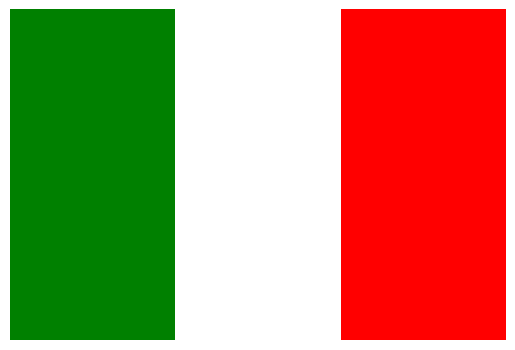

In [51]:
from matplotlib.colors import ListedColormap
cmap = ListedColormap(['green', 'white', 'red'])
im = np.array([[1,]*50+[2,]*50+[3,]*50 for _ in range(100)]) # 100 x 150
plt.imshow(im, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

### **EXERCISE 1** 💻

> Now perform SVD on `im`. How many positive singular values you have?

> Plot both U, S, and V
> Is the matrix complex or simple?
> Is the matrix S all zeros or not?

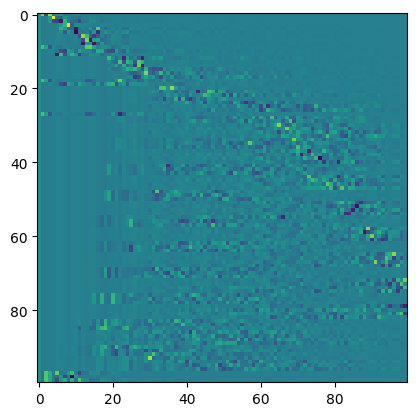

[2.64575131e+02 2.64363662e-14 2.64363662e-14 2.64363662e-14
 2.64363662e-14]


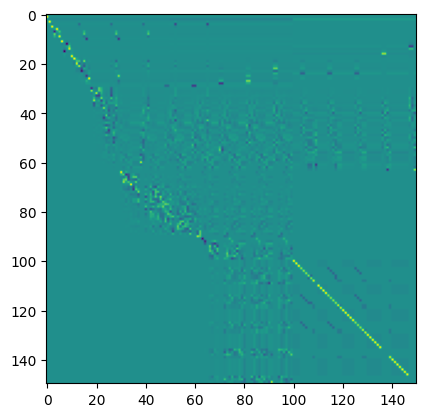

In [52]:
U, S, V = np.linalg.svd(im)
plt.imshow(U)
plt.show()
# S is a diagonal matrix with 0s elsewhere
print(S[0:5]) 
#only the first value is non zero, therefore the matrix can be compressed to 1 dimensional
plt.imshow(V)
plt.show()

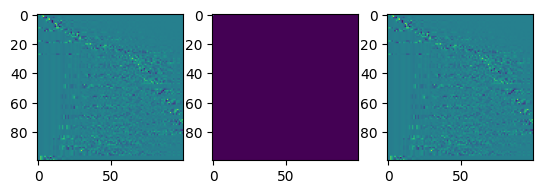

In [53]:
# @title 👀 Solution
U, S, V = np.linalg.svd(im)
fig, axs = plt.subplots(1,3)
axs[0].imshow(U)
axs[1].imshow(np.diag(S))
axs[2].imshow(U)
plt.show()
## No, S is not all-zeros but it has only a singular positive singualr values
## So the matrix is very simply.
## It is so simple that can be expressed as outer product of two vectors.
## Which vectors? just select the first non-zero singular value and the corresponding
## column of U and row of V

### **EXERCISE 2** 💻

Now write the italian flag as:
$$\text{ita} = \sigma \mathbf{u}\mathbf{v}^⊤ $$

where $\mathbf{u} = \mathbf{U[:,0]}$ and $\mathbf{v} = \mathbf{V[0,:]}$ and $\sigma = \mathbf{S[0]}$

and plot the result

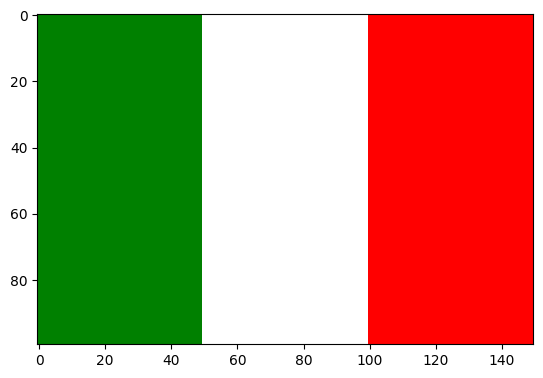

In [54]:
#Unclear what None is for...
#We undo the compression (which can be done since the 
#Sigma matrix is zeros) to get the full image back
ita = S[0] * U[:, 0, None] @ V[None, 0, :]
#conceptually we are saying the matrix ITA = U SIGMA V**T, but we know sigma is essentially just a matrix with a single value
#So instead of treating it like a matrix we treat it as a scalar.
#we use the colour map to link red to 1, white to 2 etc
plt.imshow(ita, cmap=cmap, interpolation="nearest")
plt.show()

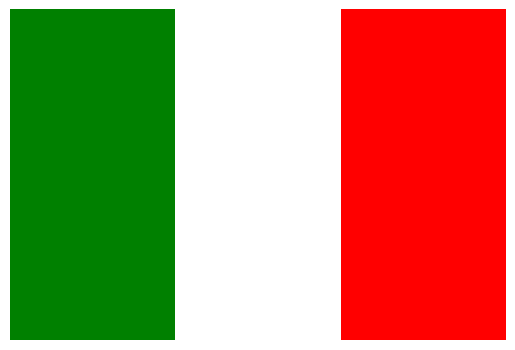

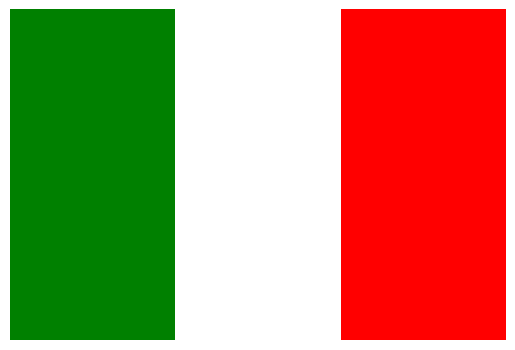

In [55]:
# @title 👀 Solution
newita = S[0]*U[:,0,None]@V[None,0,:]
plt.imshow(newita, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()
## OR
newita = S[0]*np.outer(U[:,0],V[0,:])
plt.imshow(newita, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

Indeed if you see this code

```python
im = np.array([[1,]*50+[2,]*50+[3,]*50 for _ in range(100)]) # 100 x 150
```
it is basically implementing
$$\text{ita} = \sigma \mathbf{u}\mathbf{v}^⊤ $$
but without the $\sigma$

### **EXERCISE 3** 💻
Can you rewrite the for loop above as outer product between two vectors?


In [56]:
# Italian flag 1 pixel tall
annorexic_flag = np.array([1,]*50+[2,]*50+[3,]*50)
#array of 1s, one for each pixel in height
col_array = np.ones((100,1))
ita_outer_prod = np.outer(col_array,annorexic_flag)
plt.imshow(ita_outer_prod, cmap=cmap, interpolation="nearest")

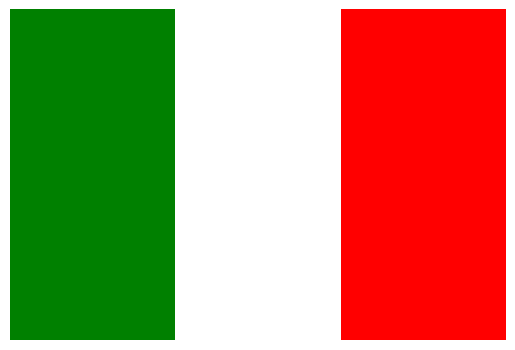

In [57]:
# @title 👀 Solution
# a column vector of all 1 to repeat the row vector
# a row vector with the colors
# so we do
#####################################
# 1 *  [1 1 1 ..2 2 2 ... 3 3 3 ]
# 1               |
# 1               v
# 1
# 1
####################################
c = np.array([1,]*100)
r = np.array([1,]*50+[2,]*50+[3,]*50)
newita = np.outer(c,r)
plt.imshow(newita, cmap=cmap, interpolation='nearest')
plt.axis('off')
plt.show()

### Japan flag

Now let's create a japan flag.

How many sum of outer do you think you need to build the japan flag?

$$ \text{japan} = \sigma_1\mathbf{u}_1\mathbf{v}_1^\top +\ldots \sigma_r\mathbf{u}_r\mathbf{v}_r^\top $$


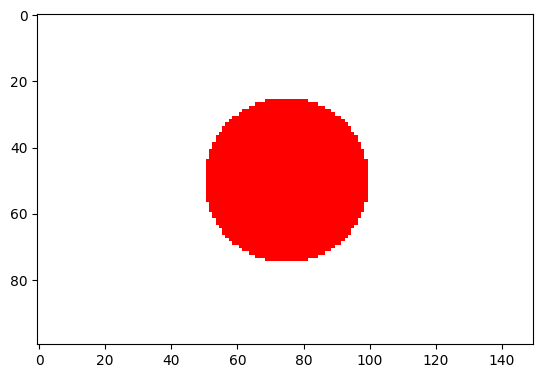

In [58]:
def create_japan_flag(W, H):
  cmap = ListedColormap(['white', 'red'])
  # Create a numpy array to represent the flag
  flag = np.zeros((H, W))
  # Define the radius of the circle
  radius = min(W, H) // 4
  # Calculate the center of the circle
  center = (H // 2, W // 2)
  # Create a meshgrid
  x, y = np.ogrid[:H, :W]
  # Mask pixels outside the circle
  mask = (x - center[0]) ** 2 + (y - center[1]) ** 2 < radius ** 2
  # Set color values for the flag
  flag[mask] = 1
  return flag, cmap

# let's show it
japan, cmap =  create_japan_flag(150, 100)
plt.imshow(japan,cmap=cmap, interpolation='nearest')
plt.show()

[41.86190369  9.95894337  5.88568227  4.0092775   3.25530314  2.59489397
  2.2892005   2.09618158  1.66814077  1.63442265  1.44305686  1.24221272
  1.21342327  1.08077871]


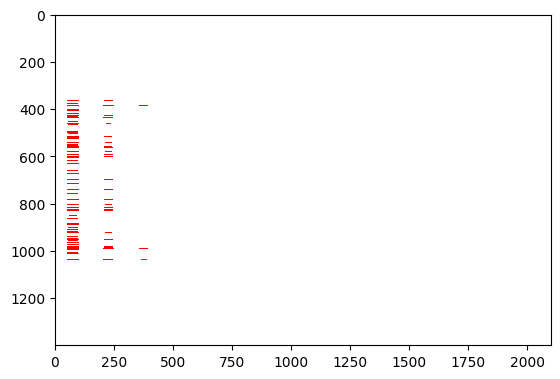

In [59]:
# @title 🧑🏿‍💻 Your code here
U, S, V = np.linalg.svd(japan)
print(S[0:14])
# newjap = np.outer(U[:, 0], V[0, :])
newjap = np.outer(U[:, 0:14], np.outer(S[0:14],V[0, :]))
plt.imshow(newjap,cmap = cmap, interpolation='nearest')
plt.show()

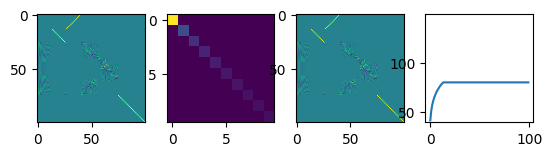

4

In [60]:
# @title 👀 Solution
U, S, V = np.linalg.svd(japan)
fig, axs = plt.subplots(1,4)
axs[0].imshow(U)
axs[1].imshow(np.diag(S[:10]))
axs[2].imshow(U)
axs[3].plot(S.cumsum())
axs[3].axis('square')
plt.show()
# It looks that with around 4 we will do it
idx = np.argmin(S.cumsum()/S.sum() < 0.8)
idx # 4 outer product cover 80% of the japan flag

### **EXERCISE 3b** 💻
Reconstruct the japan flag as a sum of 4 outer products and display at every step the creation from a bottom up pespective

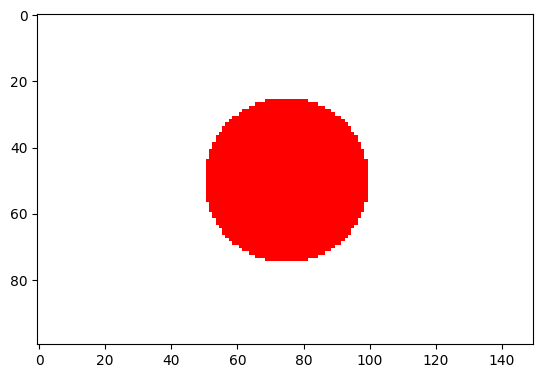

In [61]:
# @title 🧑🏿‍💻 Your code here
n =5
newjap = np.zeros((100,150))
for i in range (n):
    newjap = newjap + S[i]*np.outer(U[:, i], V[i, :])
plt.imshow(newjap, cmap=cmap, interpolation="nearest")
plt.show()

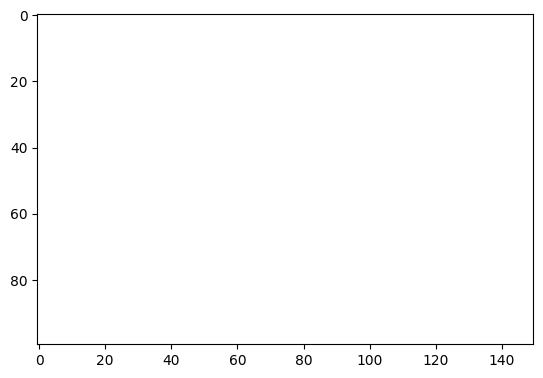

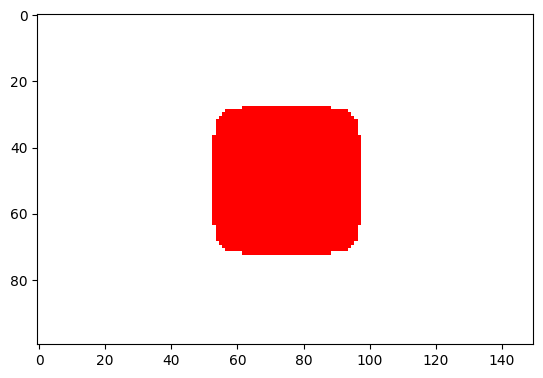

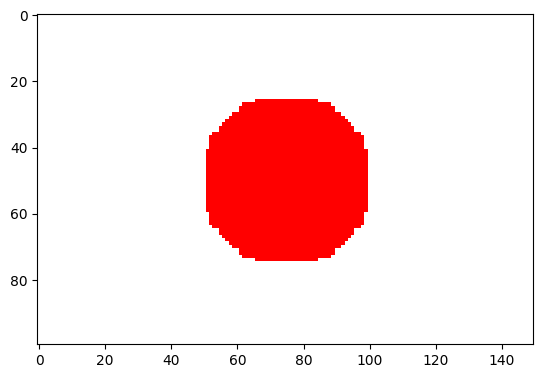

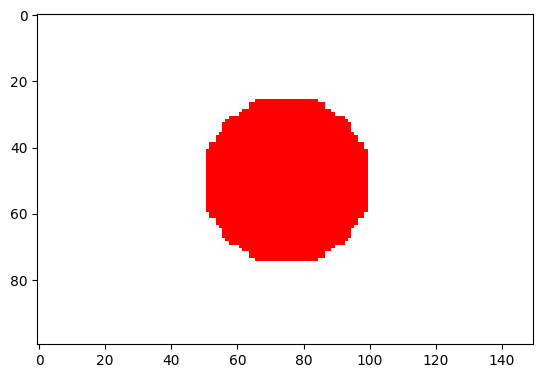

In [62]:
# @title 👀 Solution
newjapan = np.zeros_like(japan)
for i in range(idx):
  plt.imshow(newjapan,cmap=cmap, interpolation='nearest')
  plt.show()
  newjapan += S[i]*np.outer(U[:,i],V[i,:])

### **EXERCISE 3c** 💻
Now let's try to do it with a natural image.
Download the image and convert it to grayscale

In [63]:
!wget -O image.jpg https://www.dropbox.com/scl/fi/1ply7n4cwco2jrwcq4wz7/giotto_small.png?rlkey=fjcqssjfr281v67e2zpcn8ymo&dl=0

'wget' is not recognized as an internal or external command,
operable program or batch file.
'dl' is not recognized as an internal or external command,
operable program or batch file.


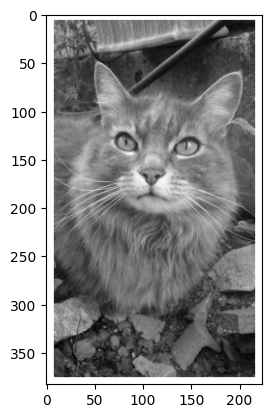

(383, 224)


In [64]:
im = cv2.imread('image.jpg').mean(axis=2)
plt.imshow(im,cmap='gray'); plt.show();
print(im.shape)

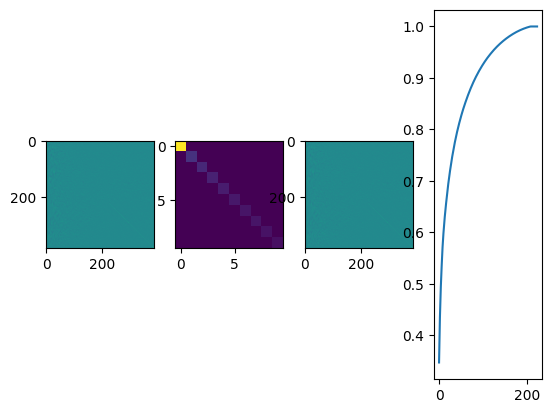

11


In [65]:
# @title 🧑🏿‍💻 Your code here
U,S,V = np.linalg.svd(im)
idx = np.argmin(S.cumsum() / S.sum() < 0.6)
idx  # ~50 outer product cover 80% of the cat
fig, axs = plt.subplots(1, 4)
axs[0].imshow(U)
axs[1].imshow(np.diag(S[:10]))
axs[2].imshow(U)
axs[3].plot(S.cumsum() / S.sum())
plt.show()
# It looks that with around 4 we will do it
print(idx)

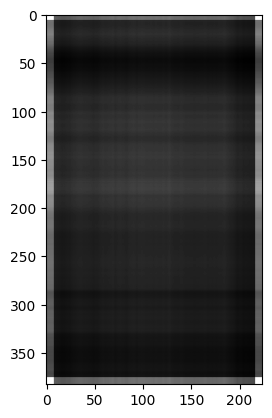

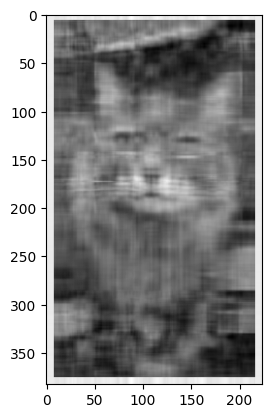

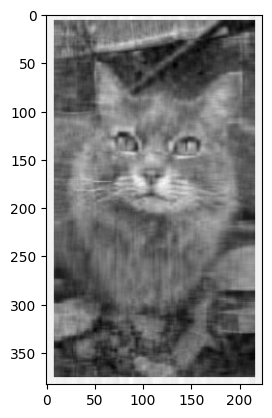

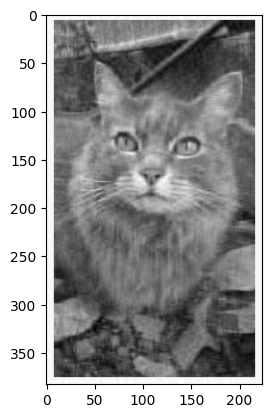

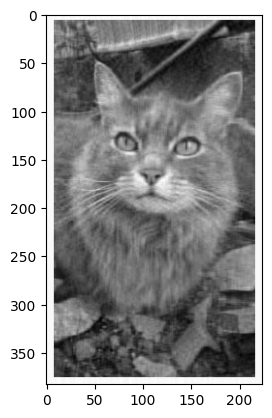

In [66]:
cat = np.zeros_like(im)
for i in range(40):
    cat += S[i]*np.outer(U[:,i],V[i,:])
    if i%10 == 0:
        plt.imshow(cat, cmap="gray")
        plt.show()
plt.imshow(cat, cmap="gray")
plt.show()

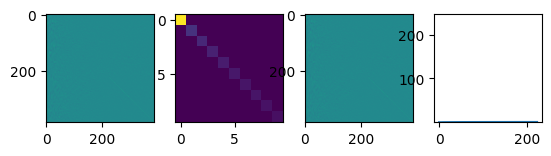

11


In [67]:
# @title 👀 Solution
U, S, V = np.linalg.svd(im)
idx = np.argmin(S.cumsum()/S.sum() < 0.6)
idx # 4 outer product cover 80% of the japan flag
fig, axs = plt.subplots(1,4)
axs[0].imshow(U)
axs[1].imshow(np.diag(S[:10]))
axs[2].imshow(U)
axs[3].plot(S.cumsum()/S.sum())
axs[3].axis('square')
plt.show()
# It looks that with around 4 we will do it
print(idx)

In [68]:
# @title 👀 Solution
newim = np.zeros_like(im)
print(f'We describe well this image with {idx} vectors od dim 800; '
      f'{idx} vectors od dim 450; and {idx}scalar')
for i in range(idx):
  plt.imshow(newim,cmap='gray', interpolation='nearest')
#   plt.show()
  newim += S[i]*np.outer(U[:,i],V[i,:])

We describe well this image with 11 vectors od dim 800; 11 vectors od dim 450; and 11scalar


## Butterfly Dataset

Now let us move to handle some real dataset of...butterflies

Install the data set with:

In [69]:
! pip install -qq -U datasets

In [70]:
from datasets import load_dataset

In [71]:
dataset = load_dataset("huggan/smithsonian_butterflies_subset",
                       split="train")

Repo card metadata block was not found. Setting CardData to empty.


In [72]:
# @title Check dataset object
type(dataset)

datasets.arrow_dataset.Dataset

In [73]:
# @title Eval dataset object
dataset

Dataset({
    features: ['image_url', 'image_alt', 'id', 'name', 'scientific_name', 'gender', 'taxonomy', 'region', 'locality', 'date', 'usnm_no', 'guid', 'edan_url', 'source', 'stage', 'image', 'image_hash', 'sim_score'],
    num_rows: 1000
})

In [74]:
dataset.features

{'image_url': Value(dtype='string', id=None),
 'image_alt': Value(dtype='string', id=None),
 'id': Value(dtype='string', id=None),
 'name': Value(dtype='string', id=None),
 'scientific_name': Value(dtype='string', id=None),
 'gender': Value(dtype='string', id=None),
 'taxonomy': Value(dtype='string', id=None),
 'region': Value(dtype='string', id=None),
 'locality': Value(dtype='string', id=None),
 'date': Value(dtype='string', id=None),
 'usnm_no': Value(dtype='string', id=None),
 'guid': Value(dtype='string', id=None),
 'edan_url': Value(dtype='string', id=None),
 'source': Value(dtype='string', id=None),
 'stage': Value(dtype='float64', id=None),
 'image': Image(decode=True, id=None),
 'image_hash': Value(dtype='string', id=None),
 'sim_score': Value(dtype='float64', id=None)}

### **EXERCISE 4** 💻

> Given that images are in the `images` field, visualize the first image


In [75]:
# @title 🧑🏿‍💻 Your code here

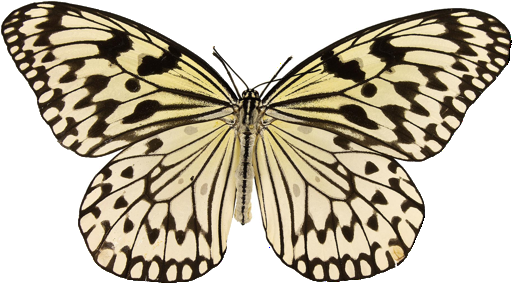

In [76]:
# @title 👀 Solution
dataset[0]['image']

### **EXERCISE 5** 💻

> Given the dataset, resize all the images to size `32x32` using `cv2.resize`
> choose a linear interpolation cv2.INTER_LINEAR
> the approach should return a tensor
> `32x32x3xN` where N is the number of samples

In [182]:
# @title 🧑🏿‍💻 Your code here

resized_images = np.array([cv2.resize(np.array(butterfly['image']),dsize=(32,32),interpolation=cv2.INTER_LINEAR) for butterfly in dataset]).transpose((1,2,3,0))
resized_images.shape

(32, 32, 3, 1000)

In [ ]:
# @title 👀 Solution
dim = 32
X = np.array([ cv2.resize(np.array(row['image']),
                         dsize=(dim, dim), interpolation=cv2.INTER_LINEAR)
             for row in dataset]).transpose((1,2,3,0))
X.shape

(32, 32, 3, 1000)

> **EXERCISE** 🧑

> Write the code to visualize the first image after resizing with matplotlib

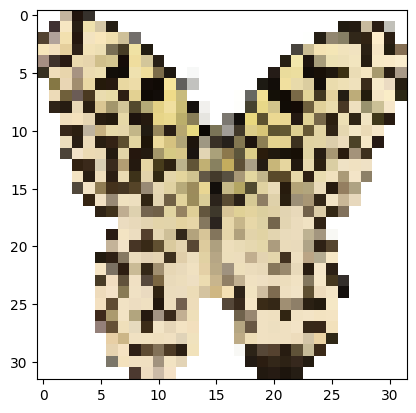

In [184]:
# @title 🧑🏿‍💻 Your code here
plt.imshow(resized_images[...,0])
plt.show()

In [80]:
# @title 👀 Solution
plt.imshow(X[...,0]);

### **EXERCISE 6** 💻

Visualize 100 **random images (not sequentially)**  sampled from the dataset forming a grid using `subplot`. The grid should be of size `100x100`.

Try to run `help(plt.subplot)` to see if can help you to visualize different images

Before plotting turn OFF interactie mode with `plt.ioff()`
Python help() is your friend

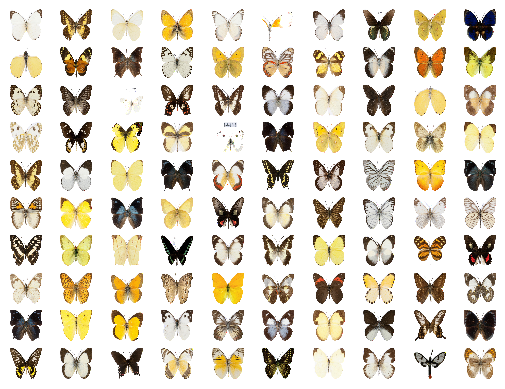

In [187]:
# @title 🧑🏿‍💻 Your code here
rng = np.random.default_rng()
numbers = rng.choice(1000, size=100, replace=False)

fig, axs = plt.subplots(nrows=10,ncols=10)
plt.axis("off")

for i, number in enumerate(numbers):
    row = i//10
    col = i%10
    axs[row,col].imshow(resized_images[...,number])
    axs[row,col].axis("off")
plt.show()

# Insert you code here to get help con plt.subplots

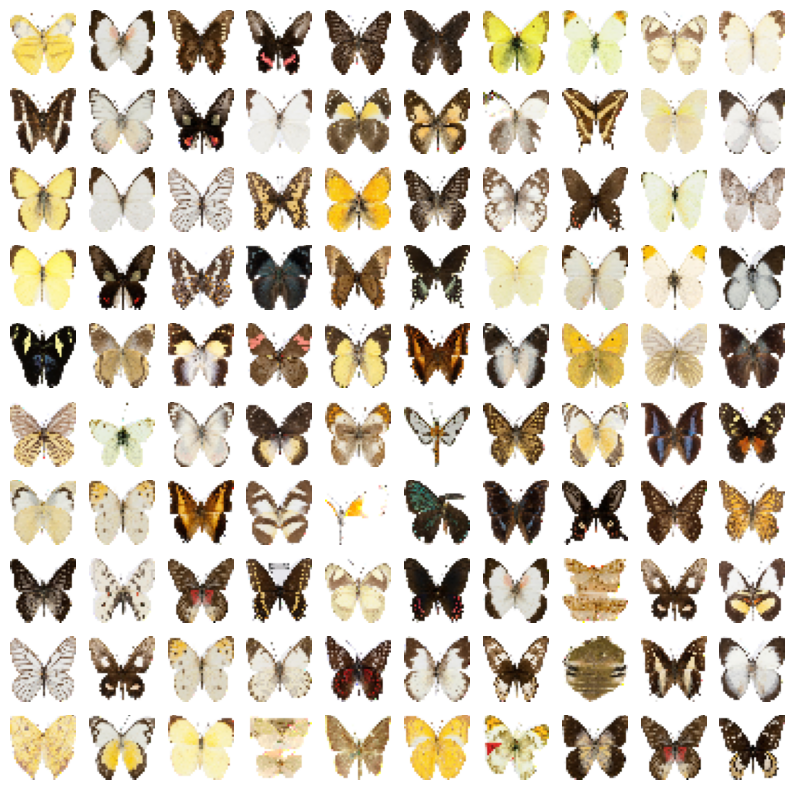

In [82]:
# @title 👀 Solution
# Turn off interactive mode
plt.ioff()
n_samples_shown = 10
fig, axs = plt.subplots(n_samples_shown, n_samples_shown, figsize=(10,10),
                        squeeze=True);

rand_idx = random.choices(range(X.shape[-1]), k=100)
# Plot
for i, idx in enumerate(rand_idx):
  r = i // n_samples_shown
  c = i % n_samples_shown
  axs[r][c].imshow(X[...,idx])
  axs[r][c].axis('off')
# Finally show
plt.show()

## Building the Statistical Model (Generative AI based on linear PCA)

Let us do it first all **manually**, then we will use sklean

> **EXERCISE** 🧑



1. Write the code to map the data into the unit cube by normalizing the axis values to stay $0...1$
2. Compute the average of the dataset and visualize it
3. Reshape X into (32x32x3)xN and center it
4. Compute the covariance matrix and extract the principal components

**Do you notice something strange in the eigenvalues?**



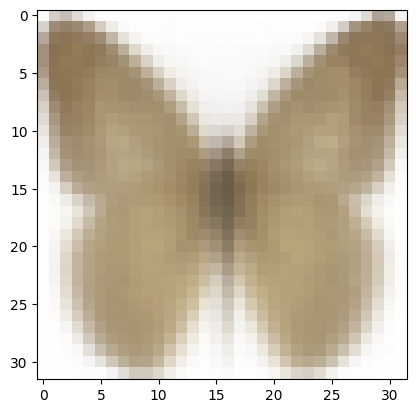

In [196]:
# @title 🧑🏿‍💻 Your code here
images_np = resized_images/255

average_butterfly = images_np.mean(axis=3)
plt.imshow(average_butterfly)
plt.show()
N = images_np.shape[3]
images_np = images_np.reshape(-1,N)
average_butterfly = images_np.mean(axis=-1, keepdims=True)
images_centered = images_np - average_butterfly
cov_matrix = 1 / N * images_centered @ images_centered.T
eig_vals, eig_vecs = np.linalg.eig(cov_matrix)

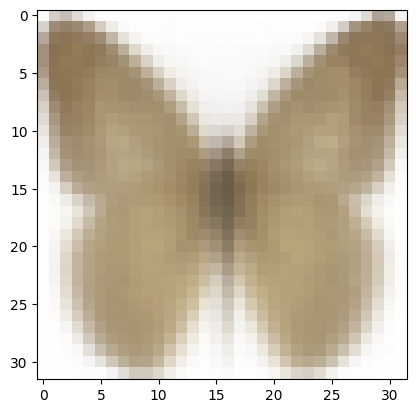

1.0


In [197]:
# @title 👀 Solution
Xd = X / 255.
N = X.shape[-1]
average = Xd.mean(axis=3)
plt.imshow(average)
plt.show()
Xd = Xd.reshape(-1, N)
average = Xd.mean(axis=-1, keepdims=True)
centered = Xd - average
C = 1/N*centered@centered.T
lambdas, U = np.linalg.eig(C)

Try to run

```python
np.where(np.isreal(lambdas)!=1)
```

At which index occurs the complex values?

In [130]:
# @title 🧑🏿‍💻 Your code here
np.where(np.isreal(eig_vals)!= 1)

(array([1000, 1001, 1002, ..., 3065, 3066, 3067], dtype=int64),)

In [131]:
# @title 👀 Solution
# They occur at around 1000 index which is not surprisingly exactly how many samples we have
# probably the numerical algorithm behind np.eig struggles to find given that
# you have 1000 samples in a 3000 dim space.
np.where(np.isreal(lambdas)!=1)[0]
# Solution retain just the first 1000 PCs which is the number of examples you have

array([1000, 1001, 1002, ..., 3056, 3065, 3066], dtype=int64)

For now let's discard the imaginary part with

```python
lambdas = np.array(lambdas[:N], float)
```
do the same on **U**

In [198]:
# @title 🧑🏿‍💻 Your code here
eig_vecs = np.array(eig_vecs[:, :N], float)
eig_vals = np.array(eig_vals[:N], float)

78.14911878336827


C:\Users\Charl\AppData\Local\Temp\ipykernel_8012\4171473293.py:2: ComplexWarning: Casting complex values to real discards the imaginary part
  eig_vecs = np.array(eig_vecs[:, :N], float)
C:\Users\Charl\AppData\Local\Temp\ipykernel_8012\4171473293.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  eig_vals = np.array(eig_vals[:N], float)


In [199]:
# @title 👀 Solution
Ud = np.array(U[:,:N], float)
lambdasd = np.array(lambdas[:N], float)

78.14911878336827


C:\Users\Charl\AppData\Local\Temp\ipykernel_8012\3825265135.py:2: ComplexWarning: Casting complex values to real discards the imaginary part
  Ud = np.array(U[:,:N], float)
C:\Users\Charl\AppData\Local\Temp\ipykernel_8012\3825265135.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  lambdasd = np.array(lambdas[:N], float)


### **EXERCISE 7** 💻

> Compute and Plot the cumulative sum of the eigenvalues to see how
> the spectrum distribute

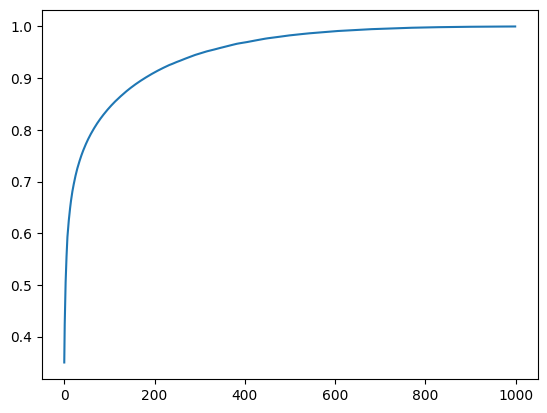

In [200]:
# @title 🧑🏿‍💻 Your code here
variance = np.cumsum(eig_vals) / eig_vals.sum()
# variance = eig_vals.cumsum() / sum(eig_vals)
plt.plot(variance)
plt.show()

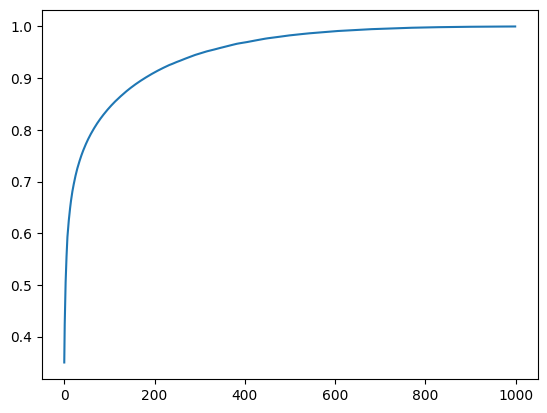

In [135]:
# @title 👀 Solution
energy = np.cumsum(lambdasd)/lambdasd.sum()
plt.plot(energy); plt.show()

### **EXERCISE 8** 💻

> Select the minimum number of components to retain
> 95% of the variance

In [201]:
# @title 🧑🏿‍💻 Your code here
retained_variance = 0.95
# Your code here

var95 = np.where(variance >= retained_variance)[0][0]

In [106]:
# @title 👀 Solution
clip_component = np.argmin(energy < retained_variance)

How many PCs (principal components) you need to retain 95% of the variance?
What is the compress ratio?

In [202]:
# @title 🧑🏿‍💻 Your code here
print(f"For 95% varaince we need the first {str(var95)} components")

For 95% varaince we need the first 309 components


In [115]:
# @title 👀 Solution
print(f'We need to retain only {clip_component} over {Xd.shape[0]} for a compress ratio of {1-clip_component/Xd.shape[0]}')

We need to retain only 309 over 3072 for a compress ratio of 0.8994140625


### **EXERCISE 9** 💻

> Now cut the `lambdas` and `U` to retain at most 95% variance

In [203]:
# @title 🧑🏿‍💻 Your code here
eig_vals95 = eig_vals[0:var95]
eig_vecs95 = eig_vecs[:,0:var95]


(3072, 309)

In [204]:
# @title 👀 Solution
Ud = Ud[:,:clip_component]
lambdasd = lambdasd[:clip_component]

(3072, 309)

Now the most difficult part the generative model 😵

What is the idea? The idea is that in the space of $[0..1]^{32\times32\times3}$ most of the points are noise. If we can use the training data to guide us on how to sample meaningful data then we built a generative model.

A stupid generative model is just return the training data + some gaussian noise perturbing the pixel. If we do so we return new points that are not exactly equal to those of the training set yet the perturbation is done in the pixel space, and as we known, pixels are fragile, thus they do not induce "semantic changes"

Let us use PCA and perturb the PCs to induce variations that have more meaning



We sample with $\mathbf{\mu} + \sum_i \alpha_i \mathbf{V}_i$ where $\alpha_i\sim \lambda_i\mathcal{N}(0;\sigma)$ where $\lambda_i$ is i-th singular value associated to the PC, sorted by eigenvalues

*   $\mathbf{\mu}$ is telling us where we should localize in space, at position $\mathbf{\mu}$
*   Each PC $\mathbf{V}_i$ tells us the direction to add to $\mathbf{\mu}$ in order to generation variation following that direction $\alpha_i$ is the strengh of how much to travel along $\mathbf{V}_i$
* **Important** Note that in our model $\alpha_i$ is increased proportioanlly by $\lambda_i$. So the eiganvalues regulate the strengh of the perturbation in each  $\mathbf{V}_i$ direction




### **EXERCISE 10** 💻

>  Generate 100 new images with the above described model and show them
> into a grid of 10x10 using subplots

> Set the $\sigma$ as sigma_pca=0.35
> When you show the images remember to push them back into the unit cube

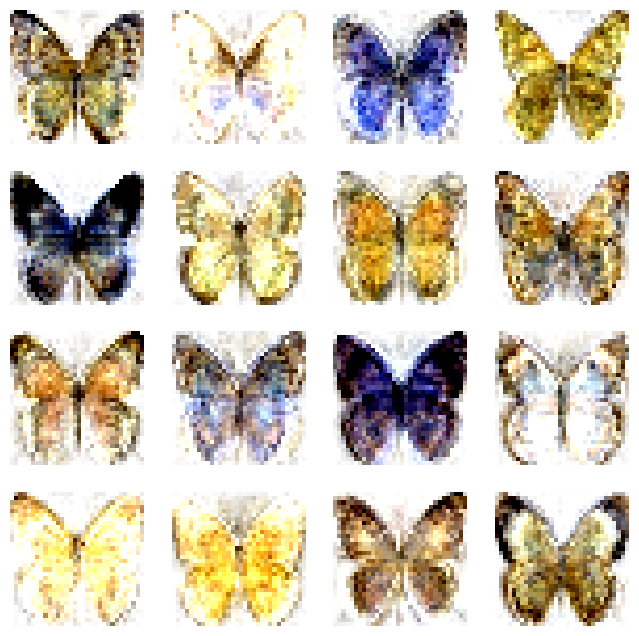

In [311]:
# @title 🧑🏿‍💻 Your code here

sigma_pca, n_plot = 1.3, 4

def np_to_img(arr, dim):
    arr = np.clip(arr, 0, 1.)  # clip so that remains in valid range
    return arr.reshape(dim, dim,-1)
fig, axs = plt.subplots(n_plot, n_plot, figsize=(8,) * 2)
for idx in range(n_plot**2):
    i, j = idx // n_plot, idx % n_plot  # getting idx for plotting
    alph_v_sum = np.copy(average_butterfly).reshape(-1)

    for k in range(var95):
        alph_v_sum += eig_vals95[k]**0.5*np.random.normal(0,sigma_pca) * eig_vecs95[:,k]

    axs[i,j].imshow(np_to_img(alph_v_sum, dim))
    axs[i,j].axis("off")
plt.show()

# @title 👀 Solution

def np_to_img(arr, dim):
    arr = np.clip(arr, 0, 1.)  # clip so that remains in valid range
    return arr.reshape(dim, dim,-1)

sigma_pca, n_plot = 1.3, 4 # the noise std. dev is 0.01; we plot 7x7 images

print(f"Using number of components {clip_component} with retained_variance {retained_variance} \n"
      f"perturbing with sigma_pca = {sigma_pca}")

fig, axs = plt.subplots(n_plot, n_plot, figsize=(8,)*2)
total = n_plot**2
for idx in range(total):
    alpha = (lambdasd**0.5*np.random.randn(clip_component)
             * sigma_pca).reshape(clip_component, 1) # shape 27
    # \mu + sum_i alpha_i * PrincComp_i
    perturb = average + Ud @ alpha
    i, j = idx//n_plot, idx % n_plot  # getting idx for plotting
    axs[i, j].imshow(np_to_img(perturb, 32)) # viz
    axs[i, j].axis('off')
plt.show()

### **EXERCISE 11** 💻

>  Write all the code in a modular way (using functions) so that we can run our approach using different principal components using other methods.

```python
def learn_PCA(Xd, method='eig'):
  # This method learn PCA
  pass
  return lambdas, U, average


def cut_spectrum(lambdas, U, retained_variance):
  # This method retain the variance
  pass
  return lambdas, U


def generate(average, Ud, lambdasd, sigma_pca = 1.3, n_plot = 10):
  # This method generate and show
  pass
```


Methods are:


1. eig (eig of Covariance)
2. svd (SVD of X data)
3. using sklearn built in functions



In [52]:
# @title 🧑🏿‍💻 Your code here

from sklearn.decomposition import PCA

def learn_PCA(Xd, method='eig'):
  if method == "eig":
    N = Xd.shape[-1]
    Xd.reshape(-1, N)
    average = Xd.mean(axis=-1, keepdims=True)
    centered = Xd - average
    C = 1 / N * centered @ centered.T
    lambdas, U = np.linalg.eig(C)
    U = np.array(U[:, :N], float)
    lambdas = np.array(lambdas[:N], float)
    return lambdas, U, average
  elif method == "svd":
     pass
  elif method == "sklearn":
     pass


def cut_spectrum(lambdas, U, retained_variance):
  retained_vals = np.where(np.cumsum(lambdas)/np.sum(lambdas)>=retained_variance)[0][0]
  return lambdas[:retained_vals], U[:,:retained_vals]


def generate(average, Ud, lambdasd, sigma_pca = 1.3, n_plot = 10):

    def np_to_img(arr, dim):
        arr = np.clip(arr, 0, 1.0)  # clip so that remains in valid range
        return arr.reshape(dim, dim, -1)

    fig, axs = plt.subplots(n_plot, n_plot, figsize=(8,) * 2)
    for idx in range(n_plot**2):
        i, j = idx // n_plot, idx % n_plot  # getting idx for plotting
        alph_v_sum = np.copy(average).reshape(-1)

        for k in range(lambdas.shape[0]):
            alph_v_sum += lambdasd[k] ** 0.5 * np.random.normal(0, sigma_pca) * Ud[:, k]

        axs[i,j].imshow(np_to_img(alph_v_sum, dim))
        axs[i,j].axis("off")
    plt.show()

In [53]:
# @title 👀 Solution
from sklearn.decomposition import PCA

def learn_PCA(Xd, method='eig'):
  # write your code here
  average = Xd.mean(axis=-1, keepdims=True)
  if method == 'eig':
    C = 1/N*(Xd - average)@(Xd - average).T
    lambdas, U = np.linalg.eig(C)
    U = np.array(U[:,:N], float)
    lambdas = np.array(lambdas[:N], float)
  elif method == 'svd':
    U, S, V = np.linalg.svd((Xd - average), full_matrices=False)
    lambdas = S**2/Xd.shape[-1]
  elif method == 'sklearn':
    pca = PCA()
    princ = pca.fit(Xd.T)
    lambdas = princ.singular_values_**2
    U = princ.components_.T
    average = princ.mean_.reshape(-1,1)
  else:
    raise NotImplementedError(f' method {method}  not implemented')
  return lambdas, U, average


def cut_spectrum(lambdas, U, retained_variance):
  # write your code here
  clip_component = np.argmin(energy < retained_variance)
  return lambdasd[:clip_component], U[:,:clip_component]


def generate(average, Ud, lambdasd, sigma_pca = 1.3, n_plot = 10):
  fig, axs = plt.subplots(n_plot, n_plot, figsize=(8,)*2)
  total = n_plot**2
  clip_component = Ud.shape[-1]
  for idx in range(total):
      alpha = (lambdasd**0.5*np.random.randn(clip_component)
              * sigma_pca).reshape(clip_component, 1) # shape 27
      # \mu + sum_i alpha_i * PrincComp_i
      perturb = average + Ud @ alpha
      i, j = idx//n_plot, idx % n_plot  # getting idx for plotting
      axs[i, j].imshow(np_to_img(perturb, 32)) # viz
      axs[i, j].axis('off')
  plt.show()

### **EXERCISE 12** 💻

Measure the computing time of the two appraoches

EIG of Cov vs SVD

using

```python
%%timeit -r 1 -n 1
```

which one is faster?

In [54]:
# @title 🧑🏿‍💻 Your code here

In [55]:
# @title 👀 Solution

C:\Users\Charl\AppData\Local\Temp\ipykernel_16132\2794788733.py:10: ComplexWarning: Casting complex values to real discards the imaginary part
  U = np.array(U[:,:N], float)
C:\Users\Charl\AppData\Local\Temp\ipykernel_16132\2794788733.py:11: ComplexWarning: Casting complex values to real discards the imaginary part
  lambdas = np.array(lambdas[:N], float)


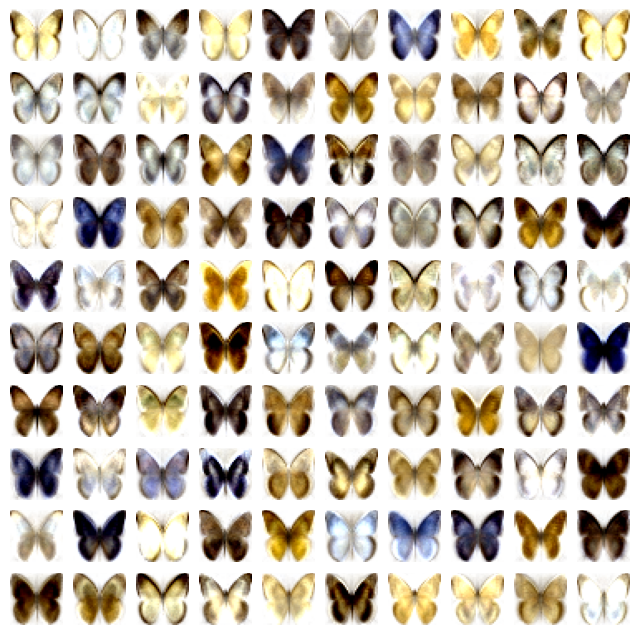

19 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [56]:
%%timeit -r 1 -n 1
lambdasd, Ud, average = learn_PCA(Xd, method='eig')
lambdasd, Ud = cut_spectrum(lambdasd, Ud, retained_variance)
generate(average, Ud, lambdasd)

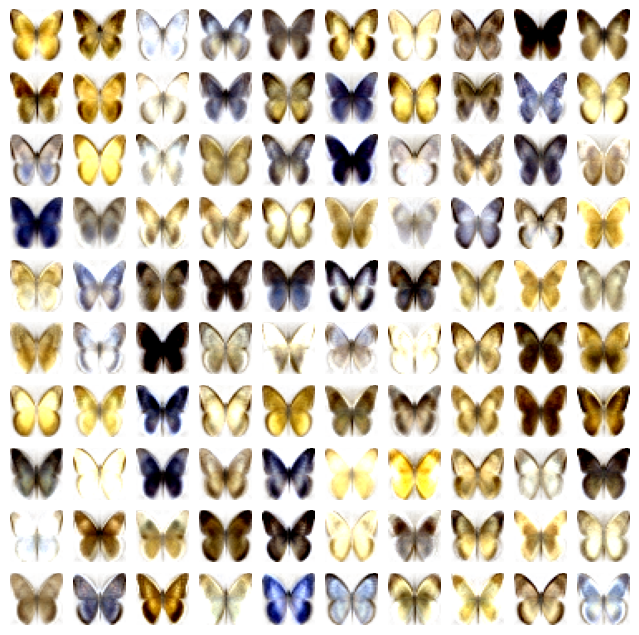

3.87 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [57]:
%%timeit -r 1 -n 1
lambdasd, Ud, average = learn_PCA(Xd, method='svd')
lambdasd, Ud = cut_spectrum(lambdasd, Ud, retained_variance)
generate(average, Ud, lambdasd)
## The difference shuld be big: eig 40 s vs svd 7s

## Let us process the dataset so to "help" PCA

PCA works well when the data is "smooth" and "contains" low frequency content.

When we resized the images from a big size to a small size (32x32) we could have created "artifacts" (aliasing) that mislead PCA.

### What is aliasing?
Means creating an "alias", which means something similar but that is not true.

![Aliasing](https://docs-be.ni.com/bundle/labwindows-cvi/page/advancedanalysisconcepts/guid-932173fe-d89c-4bc0-a3ed-980f99bcc06b-help-web.png?_LANG=enus)

From Wikipedia:

> In signal processing and related disciplines, aliasing is the overlapping of frequency components resulting from a sample rate below the Nyquist rate. This overlap results in distortion or artifacts when the signal is reconstructed from samples which causes the reconstructed signal to differ from the original continuous signal. Aliasing that occurs in signals sampled in time, for instance in digital audio or the stroboscopic effect, is referred to as temporal aliasing. Aliasing in spatially sampled signals (e.g., moiré patterns in digital images) is referred to as spatial aliasing.

### Spatial Aliasing

<img src='https://upload.wikimedia.org/wikipedia/commons/3/31/Moire_pattern_of_bricks.jpg' width="300pixel">


<img src='https://upload.wikimedia.org/wikipedia/commons/f/fb/Moire_pattern_of_bricks_small.jpg' width="200pixel">

Why we see those pattern? Sampling rate is not adeguate to the high frequency of the input signal (left)

### Temporal Aliasing
<img src='https://upload.wikimedia.org/wikipedia/commons/3/3e/WagonWheelEffect.gif' width="300pixel">

**What do we do ?**

## Buttefly Dataset Revisited

<img src='https://image.slideserve.com/189297/subsampling-with-gaussian-pre-filtering-l.jpg' width=50%>

### **EXERCISE 13**  💻

Take the original butterfly dataset and:

1. Create more samples by simply flipping all the butterflyes onto the other side (flip across vertical axis), so we double the number of samples. **unrelated to aliasing**

2. Before resizing to 32x32 apply a Gaussian filter with a certain sigma $\sigma_{\text{gauss}}$

3. Relean PCA and generate the data using previous modular code

In [58]:
# @title 🧑🏿‍💻 Your code here
from scipy.ndimage import gaussian_filter
dim, sigma = 32, 8 #32x32

We need to retain only 23 over 3072 for acompress ratio of 0.9925130208333334


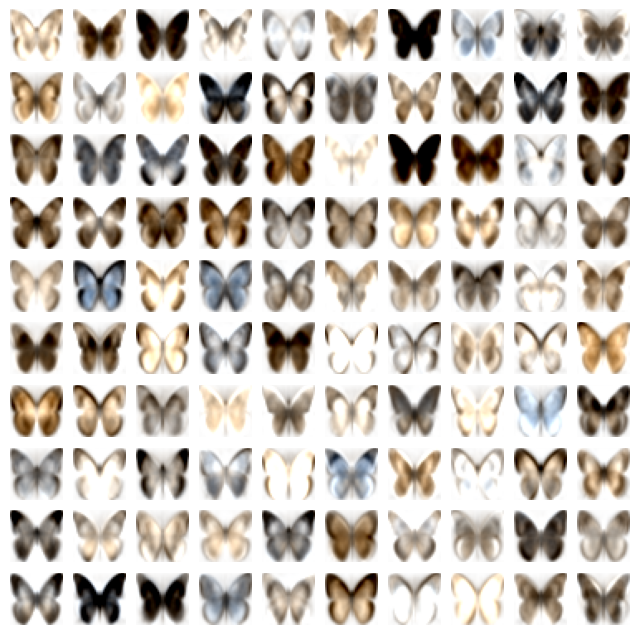

In [59]:
# @title 👀 Solution
from scipy.ndimage import gaussian_filter
dim, sigma = 32, 8 #32x32
list_data = [ cv2.resize(gaussian_filter(np.array(row['image']), sigma=(sigma,sigma,1)),
                         dsize=(dim, dim), interpolation=cv2.INTER_LINEAR)
             for row in dataset]

Xd = np.append(X,X[:,::-1,:],axis=-1)   #flipping
Xd = np.array(list_data).transpose((1,2,3,0))  #32x32x3xN
Xd = Xd.reshape(-1, N)/255.
## Learning
lambdasd, Ud, average = learn_PCA(Xd, method='svd')
lambdasd, Ud = cut_spectrum(lambdasd, Ud, 0.7)
print(f'We need to retain only {clip_component} over {Xd.shape[0]} for a'
  f'compress ratio of {1-clip_component/Xd.shape[0]}')
## Now generate
generate(average, Ud, lambdasd)

## Let us see what is the effect of each component individually!

### We sample with $\mathbf{\mu} + \alpha_i \mathbf{V}_i$ where $\alpha_i\sim \lambda_i\mathcal{N}(0;\sigma)$ where $\lambda_i$ is i-th eigenvalue associated to the PC, sorted by eigenvalues


### We will perturb the data based on the $i$ component only - Positive and Negative Direction


### **EXERCISE 14**  💻

Using what you have developed so far write a code that performa a generation on each component separately and show the results.

*   Plots of the generation of 1st PC with alpha of an eps in the **positive direction** and then another plot for **negative**
*   Plots of the generation of 2nd PC with alpha of an eps in the positive direction and then another plot for negative
*   Plots of the generation of 3rd PC with alpha of an eps in the positive direction and then another plot for negative



In [60]:
# @title 🧑🏿‍💻 Your code here

Using number of componets 23
>Inspecting component number 0 with sign 1


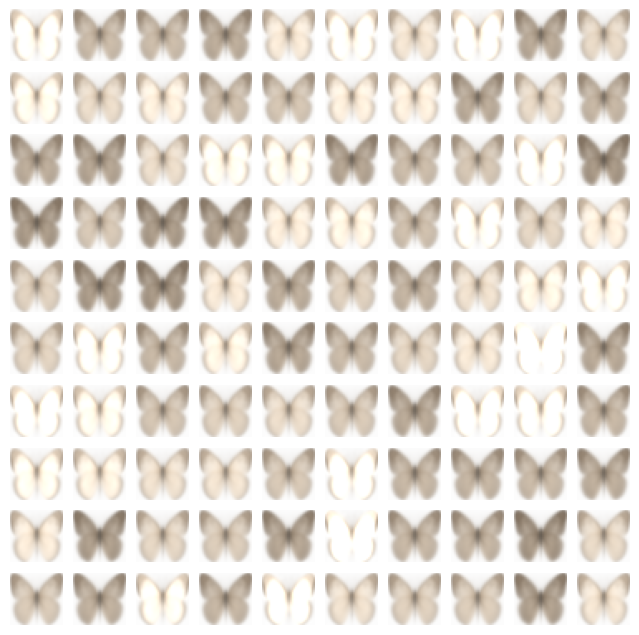

>Inspecting component number 0 with sign -1


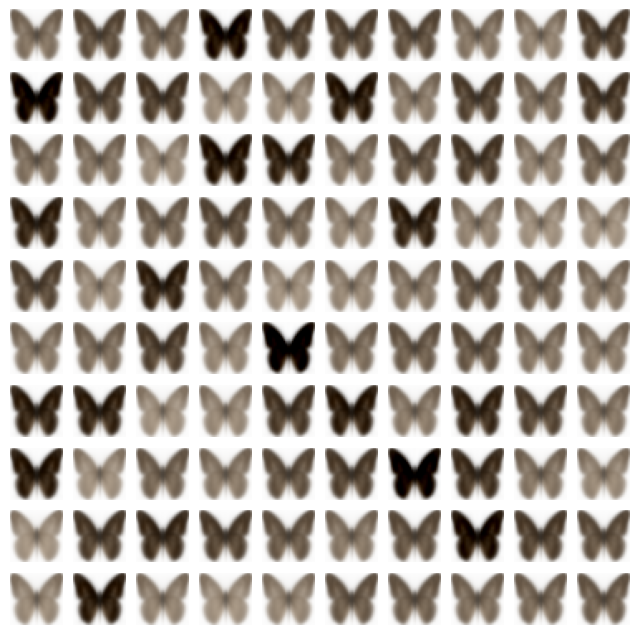

>Inspecting component number 1 with sign 1


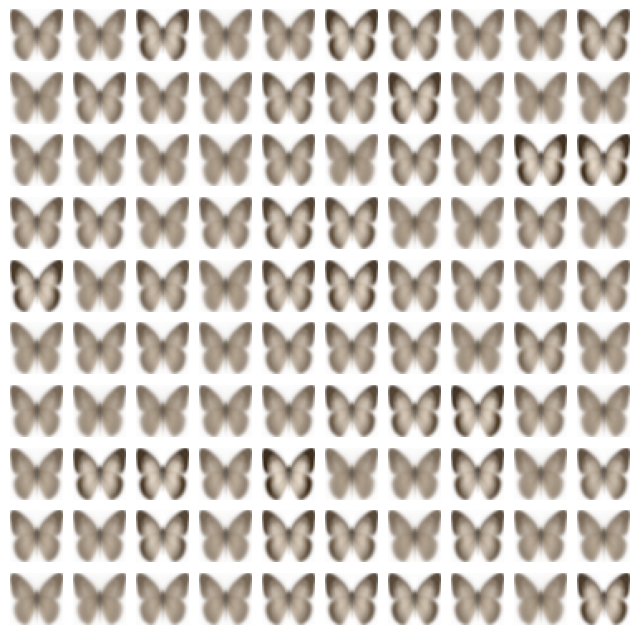

>Inspecting component number 1 with sign -1


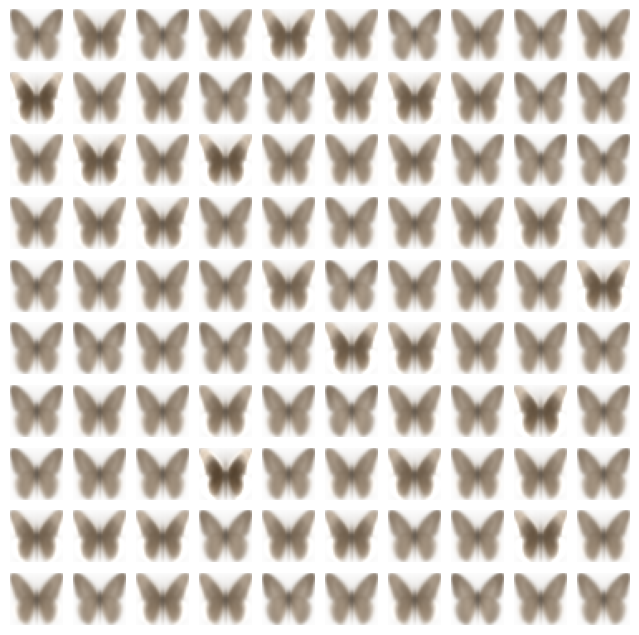

>Inspecting component number 2 with sign 1


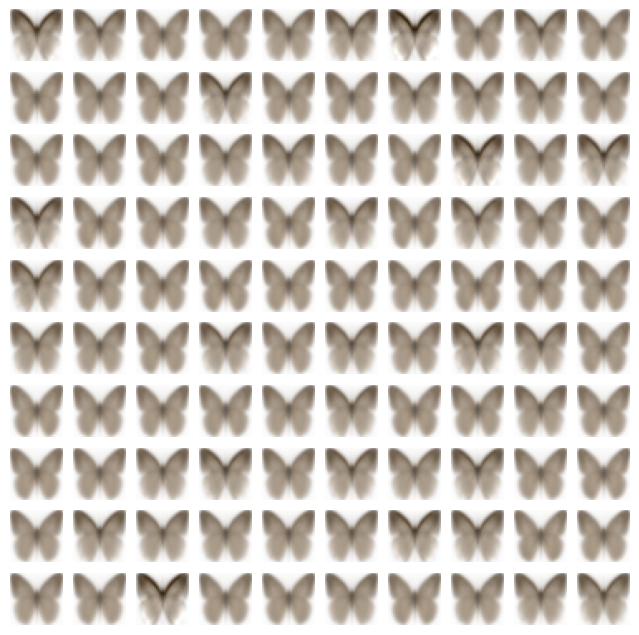

>Inspecting component number 2 with sign -1


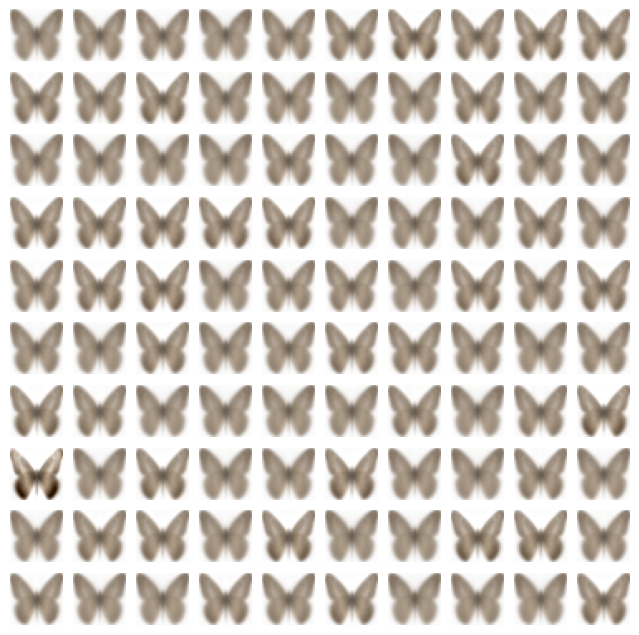

>Inspecting component number 3 with sign 1


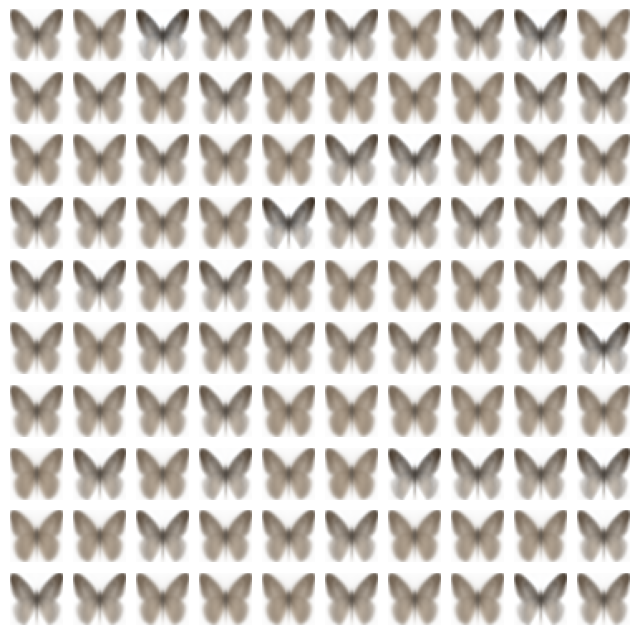

>Inspecting component number 3 with sign -1


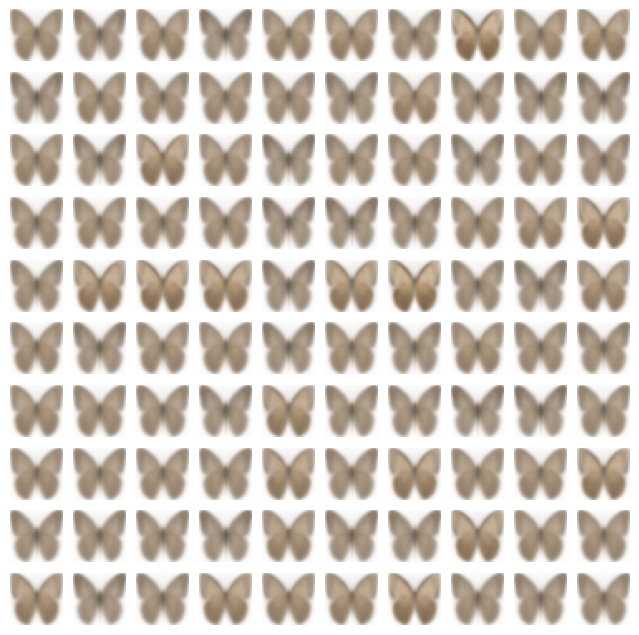

>Inspecting component number 4 with sign 1


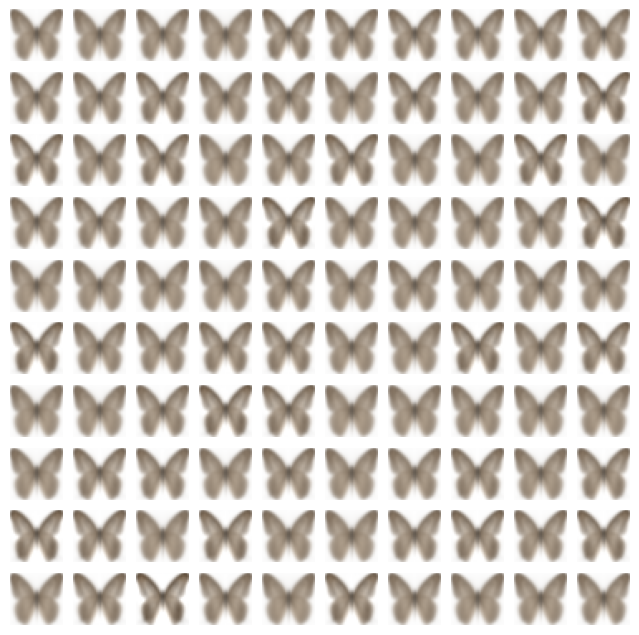

>Inspecting component number 4 with sign -1


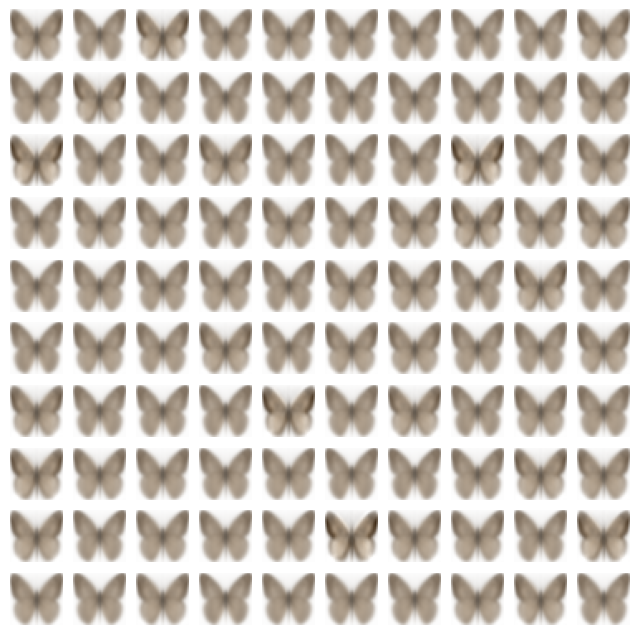

>Inspecting component number 5 with sign 1


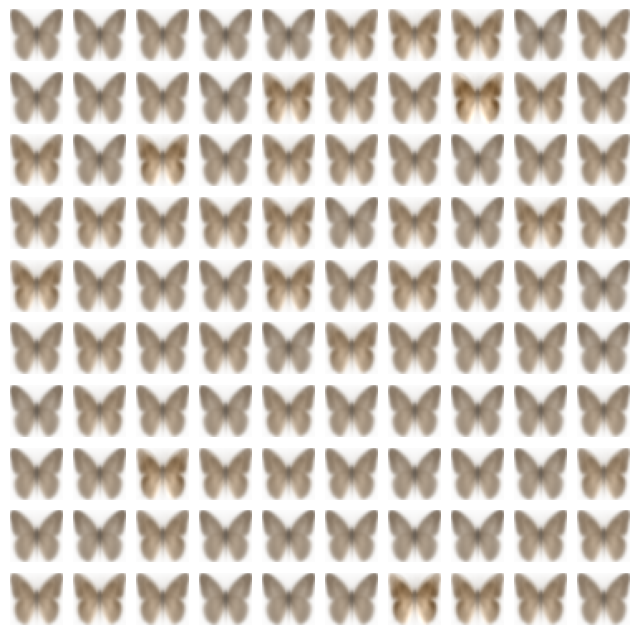

>Inspecting component number 5 with sign -1


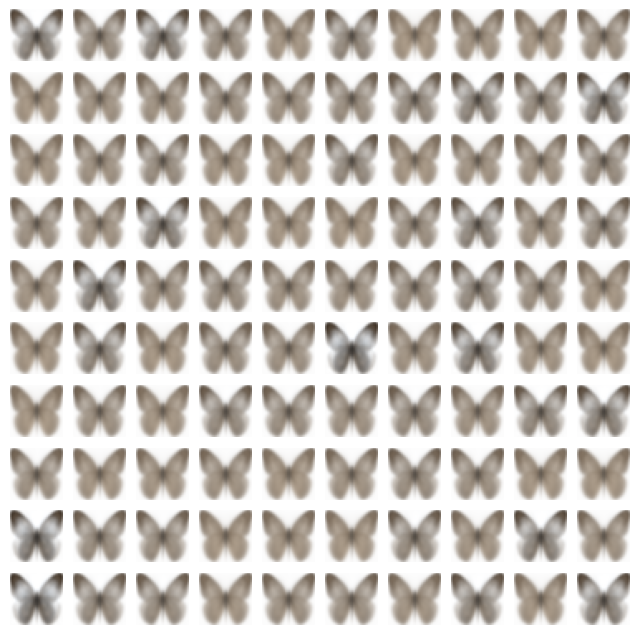

>Inspecting component number 6 with sign 1


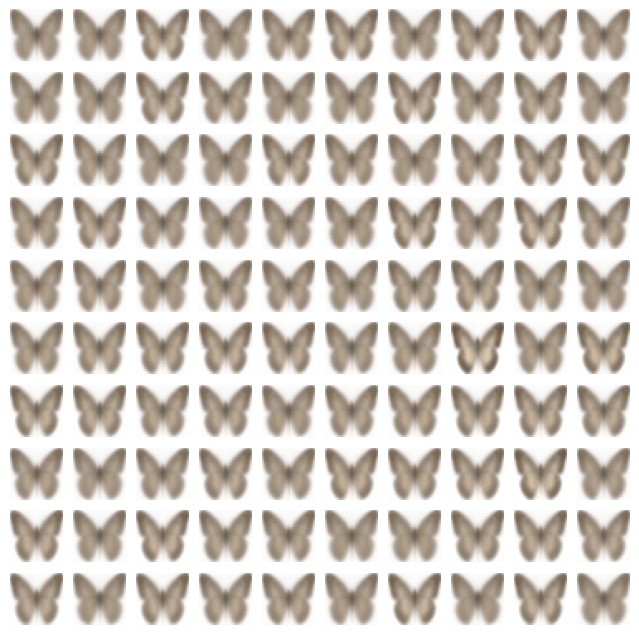

>Inspecting component number 6 with sign -1


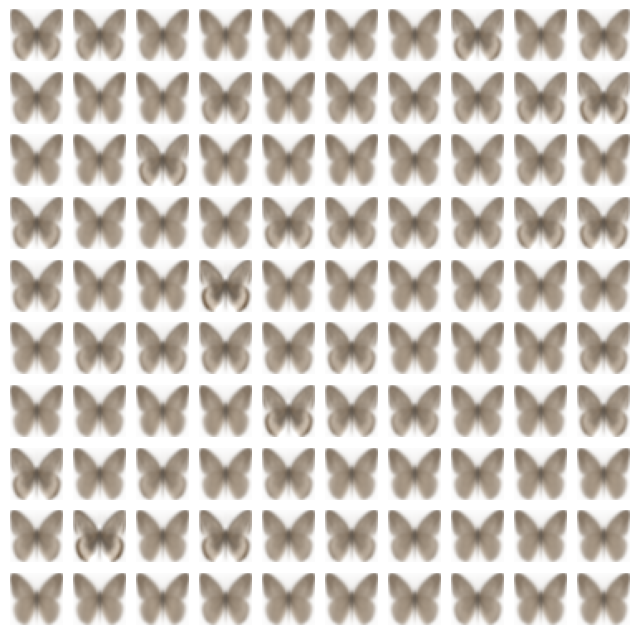

>Inspecting component number 7 with sign 1


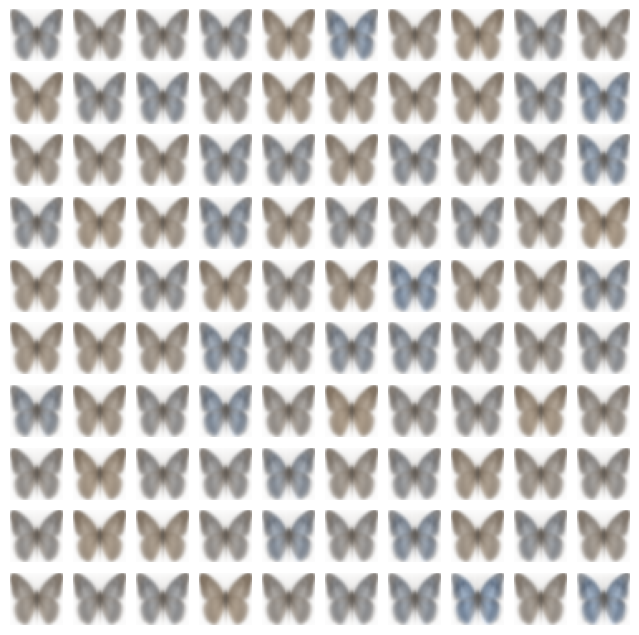

>Inspecting component number 7 with sign -1


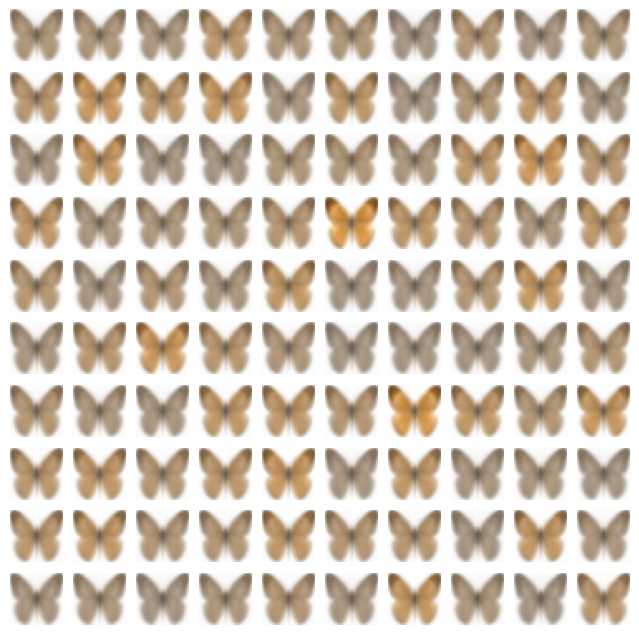

>Inspecting component number 8 with sign 1


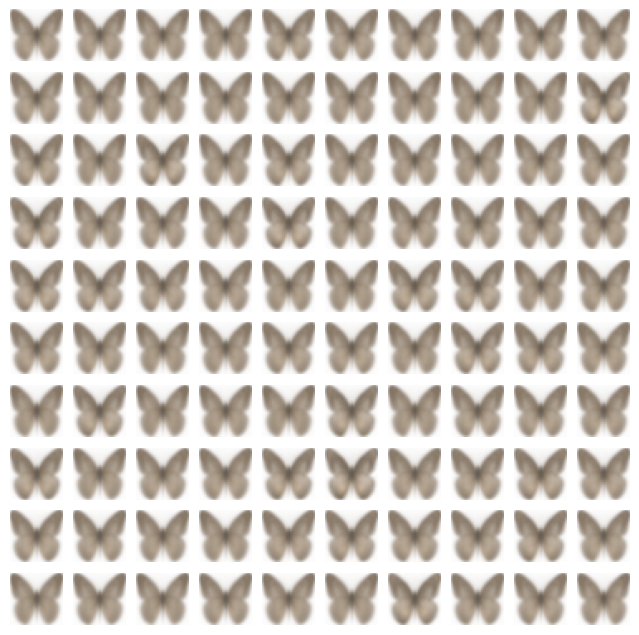

>Inspecting component number 8 with sign -1


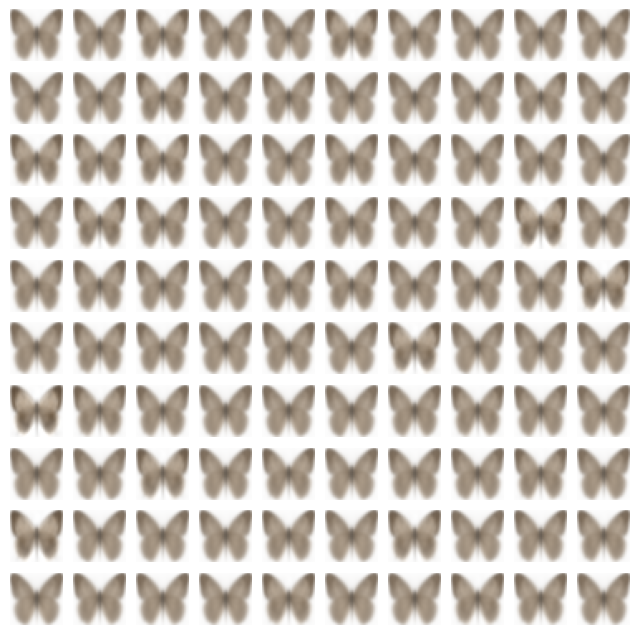

>Inspecting component number 9 with sign 1


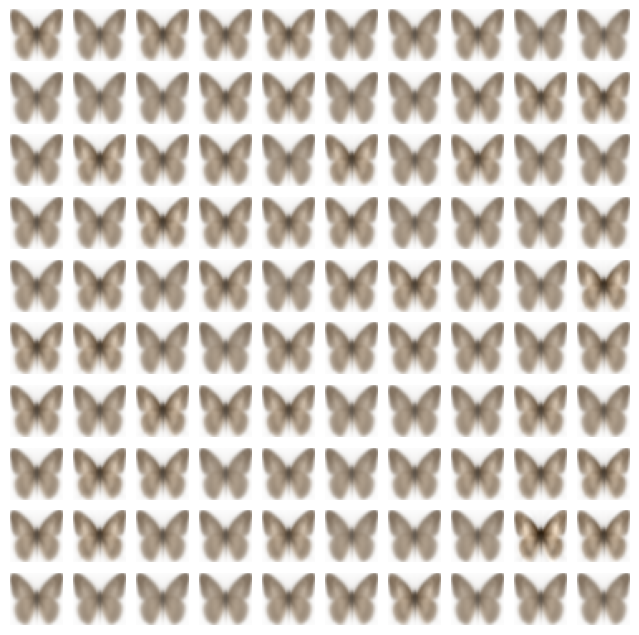

>Inspecting component number 9 with sign -1


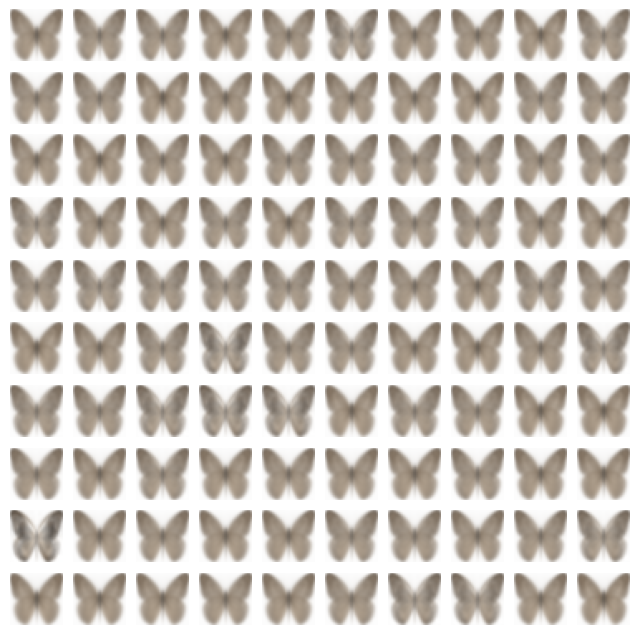

In [61]:
# @title 👀 Solution
N_components = Ud.shape[-1]
print(f'Using number of componets {N_components}')
for ncomp in range(min(10, N_components)):
    for sign in [1 ,-1]:
        print(f'>Inspecting component number {ncomp} with sign {sign}')
        sigma_pca, n_plot = 1.3, 10 # the noise std. dev is 0.01; we plot 7x7 images
        fig, axs = plt.subplots(n_plot, n_plot, figsize=(8,)*2)
        total = n_plot**2
        for idx in range(total):
            alpha = sign*lambdasd[ncomp]**0.5*sigma_pca*np.abs(np.random.randn())
            # \mu + sum_i alpha_i * PrincComp_i
            perturb = average + (alpha*Ud[:,ncomp]).reshape(-1,1)
            i, j = idx//n_plot, idx % n_plot  # getting idx for plotting
            axs[i, j].imshow(np_to_img(perturb,dim))  # viz
            axs[i, j].axis('off')
        plt.show()

### **EXERCISE 15**  💻


Write the code that shows with subplots the average and all the principal components (note that becaues the PCs are not images you have to use being them in the range 0...1)

to do this use

```python
def show_component(pc):
  std = 3*np.std(pc, axis=(0,1),keepdims=True)
  pc = np.clip(pc, a_max=std, a_min=-std)
  pc = (1 + pc / std) * 0.5
  return pc
```

**Consider a grid 3, 7**

In [62]:
# @title 🧑🏿‍💻 Your code here

def show_component(pc):
  std = 3*np.std(pc, axis=(0,1),keepdims=True)
  pc = np.clip(pc, a_max=std, a_min=-std)
  pc = (1 + pc / std) * 0.5
  return pc

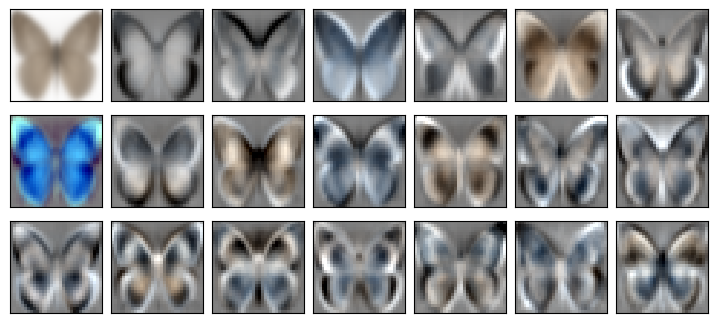

In [63]:
# @title 👀 Solution

def show_component(pc):
  std = 3*np.std(pc, axis=(0,1),keepdims=True)
  pc = np.clip(pc, a_max=std, a_min=-std)
  pc = (1 + pc / std) * 0.5
  return pc

fig, axes = plt.subplots(3, 7, figsize=(9, 4),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i, ax in enumerate(axes.flat):
    if i == 0:
        ax.imshow(average.reshape(dim, dim,-1)) #  plot mean
    else:
        ax.imshow(show_component(Ud[...,i].reshape(dim, dim,-1)), interpolation='nearest') # plots components
plt.show()

### **EXERCISE 16**  💻

If in your

```python
def generate(average, Ud, lambdasd, sigma_pca = 1.3, n_plot = 10):
```

you had some for loop for the generation, that is in order to generate 100 samples you had to for loop over 100, then now write the code to remove the for loop and do everything with matrix multiplcation.

You can still use the for loop for the subplots.

In [64]:
# @title 🧑🏿‍💻 Your code here

In [65]:
# @title 👀 Solution
def generate(average, Ud, lambdasd, sigma_pca = 1.3, n_plot = 10):
  total = n_plot**2
  clip_component = Ud.shape[-1]
  # we generate 100 in a single shot
  alpha = ((lambdasd**0.5)[:,None]*np.random.randn(clip_component,total)
              * sigma_pca)
      # \mu + sum_i alpha_i * PrincComp_i
  perturb = average + Ud @ alpha
  fig, axs = plt.subplots(n_plot, n_plot, figsize=(8,)*2)
  for idx in range(total):
      i, j = idx//n_plot, idx % n_plot  # getting idx for plotting
      axs[i, j].imshow(np_to_img(perturb[...,idx], 32)) # viz
      axs[i, j].axis('off')
  plt.show()
  return perturb
  perturb = generate(average, Ud, lambdasd)

## Optional

For those that want to practice even more what they could do they could tune all the parameters in the generation and compare the generated images with a validation set.

To do this you need to:

1. Divide the dataset into train and validation (there are prebuilt functions in sklearn to do it)
2. use `torchmetrics` such as **FID (Frechet Inception Distance)** to compute an evaluation metrics on how much the generated butterflies are similar to the real one from the validation

Please see https://lightning.ai/docs/torchmetrics/stable/image/frechet_inception_distance.html

# The end